<a href="https://colab.research.google.com/github/Chzam/Computer-Vision/blob/main/Exercise1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#                                   Zamer *CHAUDHARY*

# Exercise 1

---



---




Task 1: Load the built-in image 'coffee' of the skimage libraries. Details can be found at https://scikit-image.org/docs/stable/auto_examples/data/plot_general.html#sphx-glr-auto-examples-data-plot-general-py

<ipython-input-19-503c1cf8995e>:8: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(coffee_image)
<ipython-input-19-503c1cf8995e>:9: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()


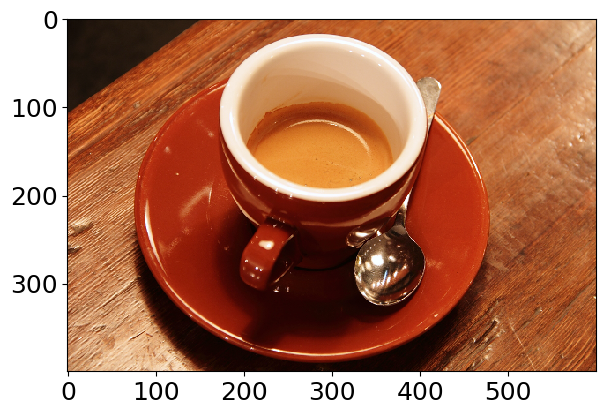

In [19]:
import skimage as sk
from skimage import data

# Load the built-in "coffee" image from skimage's data module
coffee_image = data.coffee()

# Visualize the image
sk.io.imshow(coffee_image)
sk.io.show()


 Task 2: Use the skimage function random_noise to add each of the 7 different types of noise available and generate a 4x2 panel figure with the original image and the 7 corrupted versions. The noise types are:



*   ‘gaussian’ Gaussian-distributed additive noise.
*   ‘localvar’ Gaussian-distributed additive noise, with specified local variance at each point of image.
*   ‘poisson’ Poisson-distributed noise generated from the data.
*   ‘salt’ Replaces random pixels with 1.
*   ‘pepper’ Replaces random pixels with 0 (for unsigned images) or -1 (for signed images).
*   ‘s&p’ Replaces random pixels with either 1 or low_val, where low_val is 0 for unsigned images or -1 for signed images.
*   ‘speckle’ Multiplicative noise using out = image + n*image, where n is Gaussian noise with specified mean & variance.

Documentation of the function can be found at https://scikit-image.org/docs/stable/api/skimage.util.html#skimage.util.random_noise

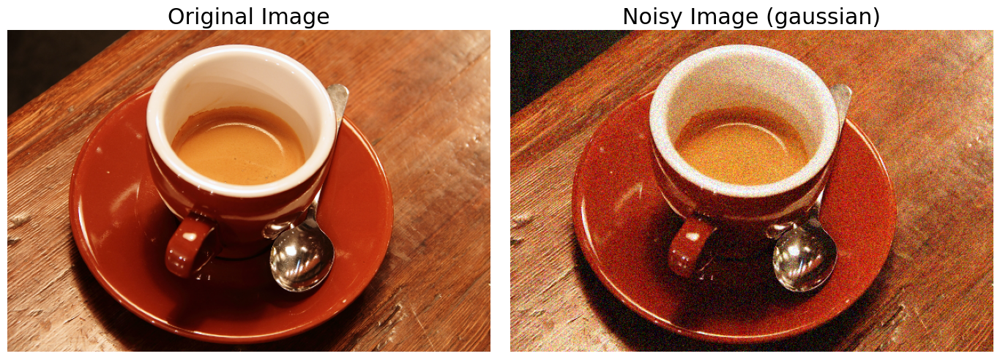

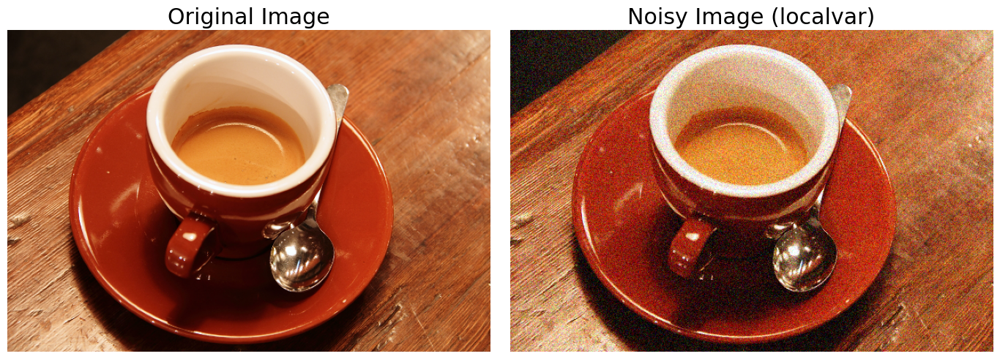

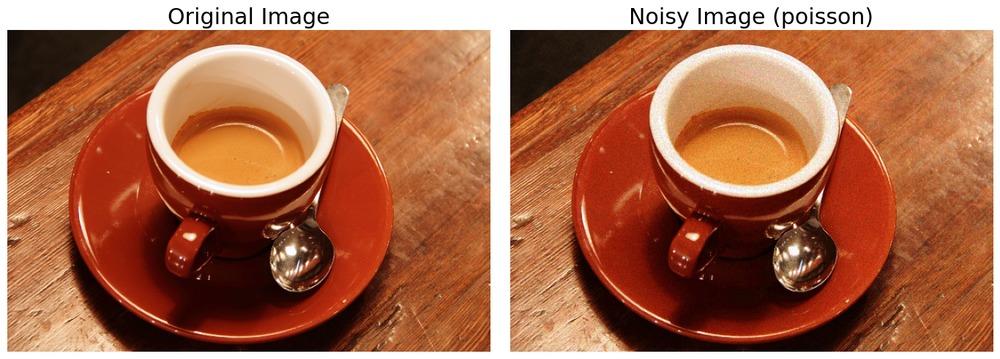

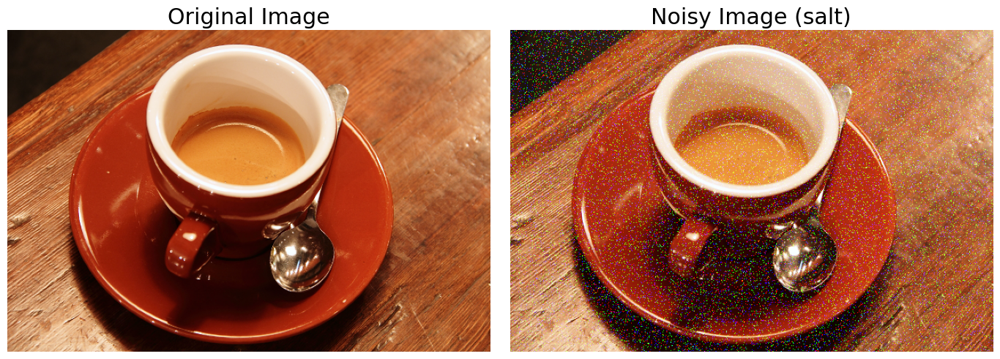

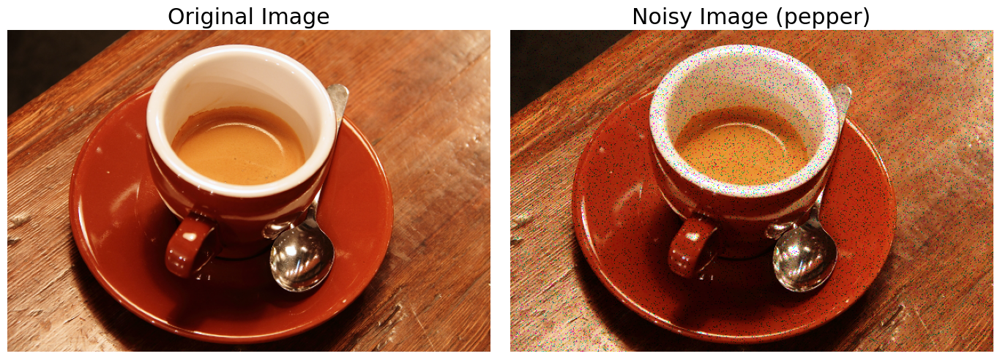

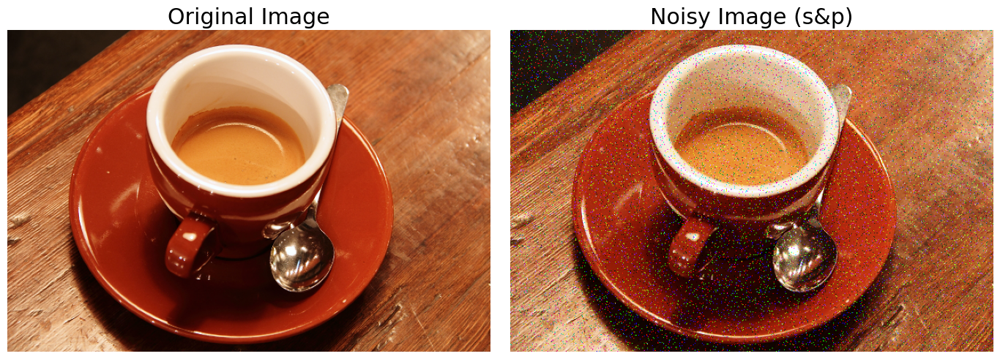

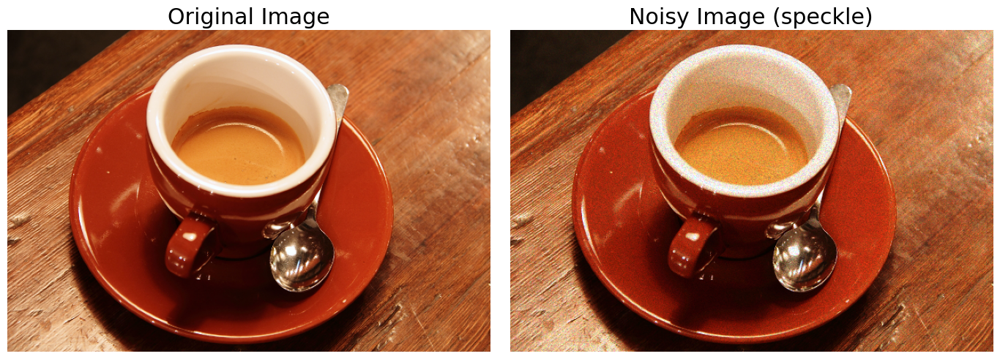

In [23]:
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import random_noise
from skimage import img_as_ubyte

# Load the coffee image
coffee_img = data.coffee()

# Function to plot comparison between the original and noisy images
def plot_comparison(original, noisy_image, noise_type):
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 6), sharex=True, sharey=True)
    ax1.imshow(original)
    ax1.set_title('Original Image')
    ax1.axis('off')
    ax2.imshow(noisy_image)
    ax2.set_title(f'Noisy Image ({noise_type})')
    ax2.axis('off')
    plt.tight_layout()
    plt.show()

# List of all noise types
noise_types = ['gaussian', 'localvar', 'poisson', 'salt', 'pepper', 's&p', 'speckle']

# Add and display different types of noise
for noise_type in noise_types:
    # Add the specified noise type to the image
    noisy_img = random_noise(coffee_img, mode=noise_type)

    # Convert to 8-bit unsigned byte format
    noisy_img = img_as_ubyte(noisy_img)

    # Plot the comparison of the original and noisy images
    plot_comparison(coffee_img, noisy_img, noise_type)


Task 3: Select one of the noise types and generate 3 noisy images with different noise intensity levels. Represent the original image along with them in a 2x2 figure.

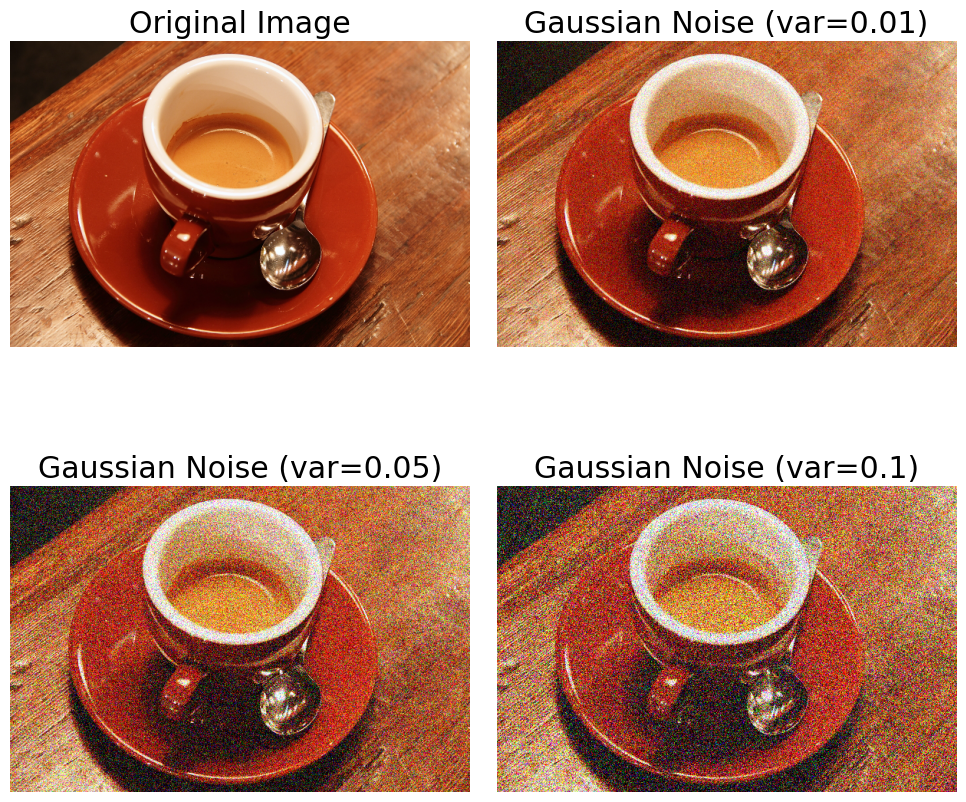

In [24]:
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import random_noise
from skimage import img_as_ubyte

# Load the coffee image
coffee_img = data.coffee()

# Function to plot comparison between the original and noisy images
def plot_comparison(original, noisy_image1, noisy_image2, noisy_image3):
    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
    axs[0, 0].imshow(original)
    axs[0, 0].set_title('Original Image')
    axs[0, 0].axis('off')

    axs[0, 1].imshow(noisy_image1)
    axs[0, 1].set_title('Gaussian Noise (var=0.01)')
    axs[0, 1].axis('off')

    axs[1, 0].imshow(noisy_image2)
    axs[1, 0].set_title('Gaussian Noise (var=0.05)')
    axs[1, 0].axis('off')

    axs[1, 1].imshow(noisy_image3)
    axs[1, 1].set_title('Gaussian Noise (var=0.1)')
    axs[1, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Generate three noisy images with different levels of Gaussian noise intensity
noisy_img1 = random_noise(coffee_img, mode='gaussian', var=0.01)
noisy_img2 = random_noise(coffee_img, mode='gaussian', var=0.05)
noisy_img3 = random_noise(coffee_img, mode='gaussian', var=0.1)

# Convert the noisy images to 8-bit unsigned integer format
noisy_img1 = img_as_ubyte(noisy_img1)
noisy_img2 = img_as_ubyte(noisy_img2)
noisy_img3 = img_as_ubyte(noisy_img3)

# Plot the original image and the noisy versions
plot_comparison(coffee_img, noisy_img1, noisy_img2, noisy_img3)


Task 4: **The standard deviation for Gaussian kernel affects the behavior of the gaussian filter (parameter sigma, see documentation https://scikit-image.org/docs/stable/api/skimage.filters.html#skimage.filters.gaussian). Explore the effect of the parameter sigma when applying a gaussian filter to the tree noisy images generated in the previus task. Represent and comment the results.

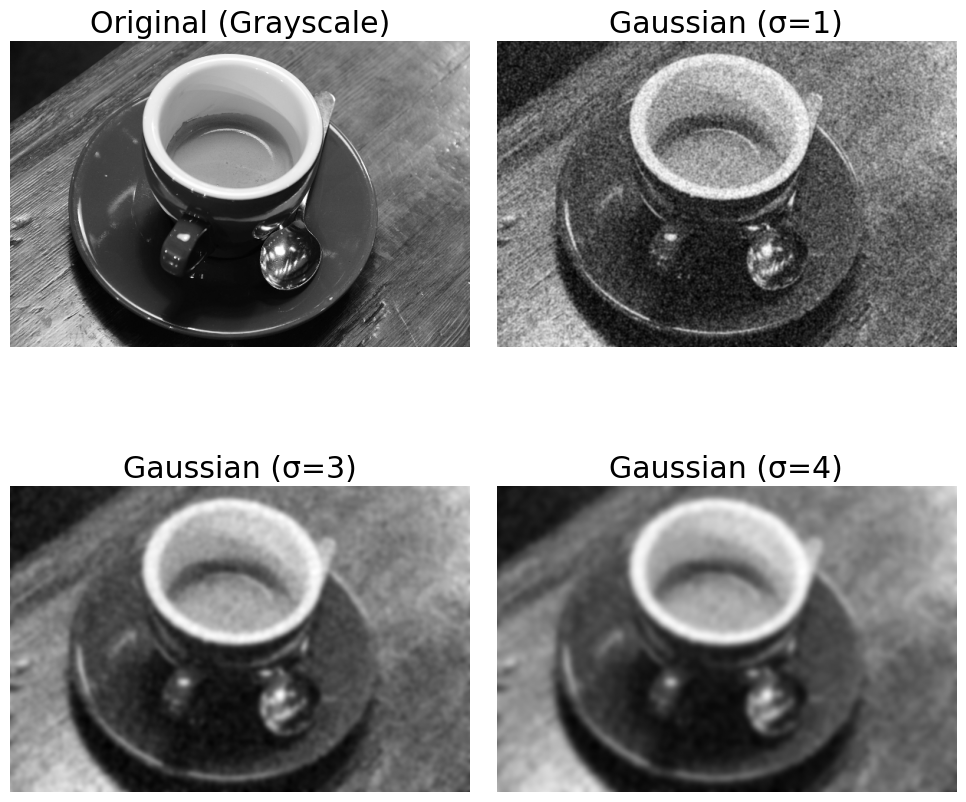

In [66]:
from skimage import data, util, filters, color
import matplotlib.pyplot as plt

# Load the coffee image
image = data.coffee()

# Convert to grayscale and normalize
image_gray = color.rgb2gray(image)

# Add Gaussian noise with fixed variance
noisy_image = util.random_noise(image_gray, mode='gaussian', var=0.05)

# Apply Gaussian filters with increasing sigma values
gaussian_1 = filters.gaussian(noisy_image, sigma=1)
gaussian_3 = filters.gaussian(noisy_image, sigma=3)
gaussian_4 = filters.gaussian(noisy_image, sigma=4)

# Plot the original and filtered images in a 2x2 grid
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

axes[0, 0].imshow(image_gray, cmap='gray')
axes[0, 0].set_title('Original (Grayscale)')
axes[0, 0].axis('off')

axes[0, 1].imshow(gaussian_1, cmap='gray')
axes[0, 1].set_title('Gaussian (σ=1)')
axes[0, 1].axis('off')

axes[1, 0].imshow(gaussian_3, cmap='gray')
axes[1, 0].set_title('Gaussian (σ=3)')
axes[1, 0].axis('off')

axes[1, 1].imshow(gaussian_4, cmap='gray')
axes[1, 1].set_title('Gaussian (σ=4)')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()


Task 5: Detect the edges of the bricks in the built-in image 'bricks' using a Prewitt edge detection filter. Quantify what is the fraction of the image corresponding to bricks and to edges.

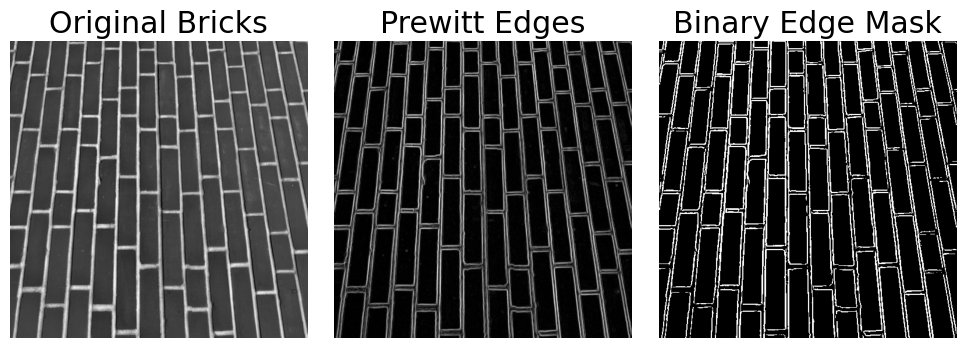

Fraction of edge pixels: 0.1504
Fraction of non-edge (brick) pixels: 0.8496


In [44]:
# Load built-in grayscale bricks image (already grayscale)
bricks = data.brick()

# Apply Prewitt filter
edges = filters.prewitt(bricks)

# Threshold edges to create binary edge mask
edge_mask = edges > 0.1  # Threshold can be adjusted

# Calculate pixel statistics
total_pixels = bricks.size
edge_pixels = np.sum(edge_mask)
non_edge_pixels = total_pixels - edge_pixels

# Compute fractions
fraction_edges = edge_pixels / total_pixels
fraction_non_edges = non_edge_pixels / total_pixels

# Plot
plt.figure(figsize=(10, 4))
plt.subplot(1, 3, 1)
plt.imshow(bricks, cmap='gray')
plt.title("Original Bricks")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(edges, cmap='gray')
plt.title("Prewitt Edges")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(edge_mask, cmap='gray')
plt.title("Binary Edge Mask")
plt.axis('off')

plt.tight_layout()
plt.show()

# Print results
print(f"Fraction of edge pixels: {fraction_edges:.4f}")
print(f"Fraction of non-edge (brick) pixels: {fraction_non_edges:.4f}")


 Task 6: Apply a high-pass filter and a low-pass filter in the frequency domain to the skimage built-in image 'grass'. Represent the results and discuss the correspondance between spatial patterns in the original image and high/low frequency components of its the Fourier transform.

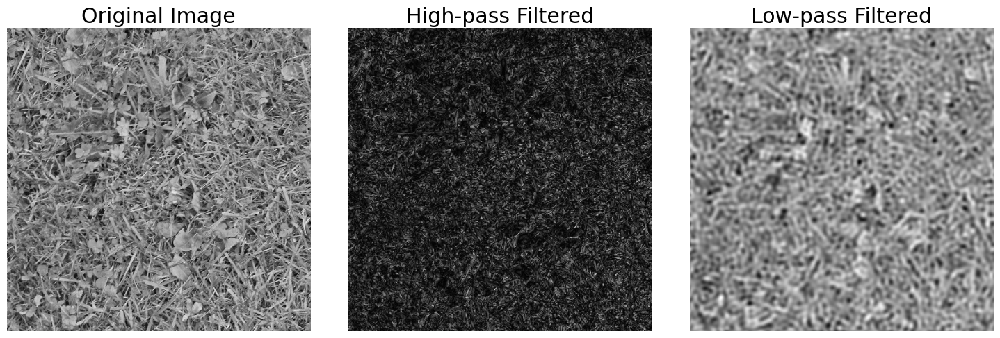

In [56]:
from skimage.util import img_as_float
from skimage import color

# Load the 'grass' image
img_rgb = data.grass()
img = img_as_float(img_rgb)  # Convert the image to float format (required for FFT)

# Function to plot comparison of images
def plot_comparison(img1, img2, img3, title1, title2, title3):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(img1, cmap='gray')
    axes[0].set_title(title1)
    axes[0].axis('off')

    axes[1].imshow(img2, cmap='gray')
    axes[1].set_title(title2)
    axes[1].axis('off')

    axes[2].imshow(img3, cmap='gray')
    axes[2].set_title(title3)
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# --- High-pass filter --- #
f = np.fft.fft2(img)  # Compute the 2D Fourier Transform of the image
fshift = np.fft.fftshift(f)  # Shift zero frequency to the center

# Get the center of the image
rows, cols = img.shape
crow, ccol = int(rows/2), int(cols/2)

# Set a square region around the center to zero (remove low frequencies)
fshift[crow-30:crow+30, ccol-30:ccol+30] = 0

# Inverse FFT to get the high-pass filtered image
f_ishift = np.fft.ifftshift(fshift)
img_back_high = np.fft.ifft2(f_ishift)
img_back_high = np.abs(img_back_high)

# --- Low-pass filter --- #
# Create a mask for the low-pass filter (remove high frequencies)
nrows, ncols = img.shape
row, col = np.ogrid[:nrows, :ncols]
cnt_row, cnt_col = nrows / 2, ncols / 2
disk_diameter = 50

# Mask to remove high frequencies (keeping the low frequencies)
outer_disk_mask = ((row - cnt_row)**2 + (col - cnt_col)**2 > (disk_diameter)**2)

# Apply the low-pass filter in frequency domain
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
fshift[outer_disk_mask] = 0  # Set high frequencies to zero

# Inverse FFT to get the low-pass filtered image
f_ishift = np.fft.ifftshift(fshift)
img_back_low = np.fft.ifft2(f_ishift)
img_back_low = np.abs(img_back_low)

# Plot the comparison
plot_comparison(img, img_back_high, img_back_low, 'Original Image', 'High-pass Filtered', 'Low-pass Filtered')


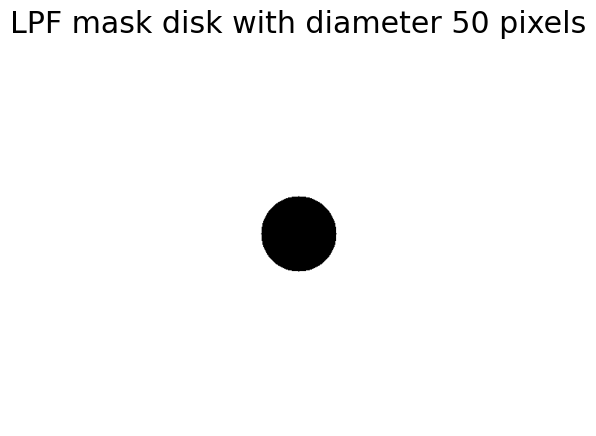

In [57]:
# Show the LPF mask
fig = plt.figure(figsize=(5, 5))
plt.imshow(outer_disk_mask, cmap=plt.cm.gray)
plt.title(f'LPF mask disk with diameter {disk_diameter} pixels')
plt.axis('off')
plt.show()



Task 7: Use the function binary_blobs to generate an image with random blobs: https://scikit-image.org/docs/stable/api/skimage.data.html#skimage.data.binary_blobs How many consecutive morphological erosions are needed in order to remove all the blobs? Use a disk-shaped structuring element of radius 3 pixels (footprint). https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk

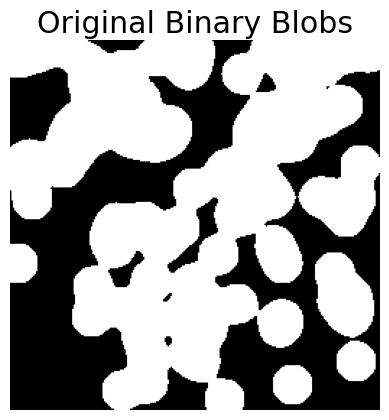

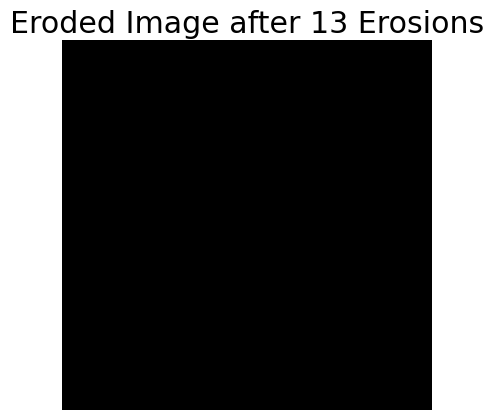

Number of consecutive erosions needed to remove all blobs: 13


In [64]:
from skimage.morphology import erosion, disk
from skimage.util import img_as_ubyte

# Generate a binary image with random blobs
image = data.binary_blobs(length=256, n_dim=2, blob_size_fraction=0.1, volume_fraction=0.6)

# Plot the original image
plt.imshow(image, cmap='gray')
plt.title('Original Binary Blobs')
plt.axis('off')
plt.show()

# Define the disk-shaped structuring element with radius 3
selem = disk(3)

# Erosion loop: count how many times we need to erode to remove all blobs
eroded_image = image.copy()
erosion_count = 0

# Apply erosion until all blobs are removed (image becomes empty)
while np.any(eroded_image):  # If there are any non-zero pixels
    eroded_image = erosion(eroded_image, selem)
    erosion_count += 1

# Plot the result after sufficient erosions
plt.imshow(eroded_image, cmap='gray')
plt.title(f'Eroded Image after {erosion_count} Erosions')
plt.axis('off')
plt.show()

# Output the number of erosions needed
print(f"Number of consecutive erosions needed to remove all blobs: {erosion_count}")
